In [1]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='darkgrid', font_scale=1.2)

In [63]:
data = "C:/Users/humza/Downloads/cats" 

# Task 2: EDA

## Technique 1: Sample batch of images

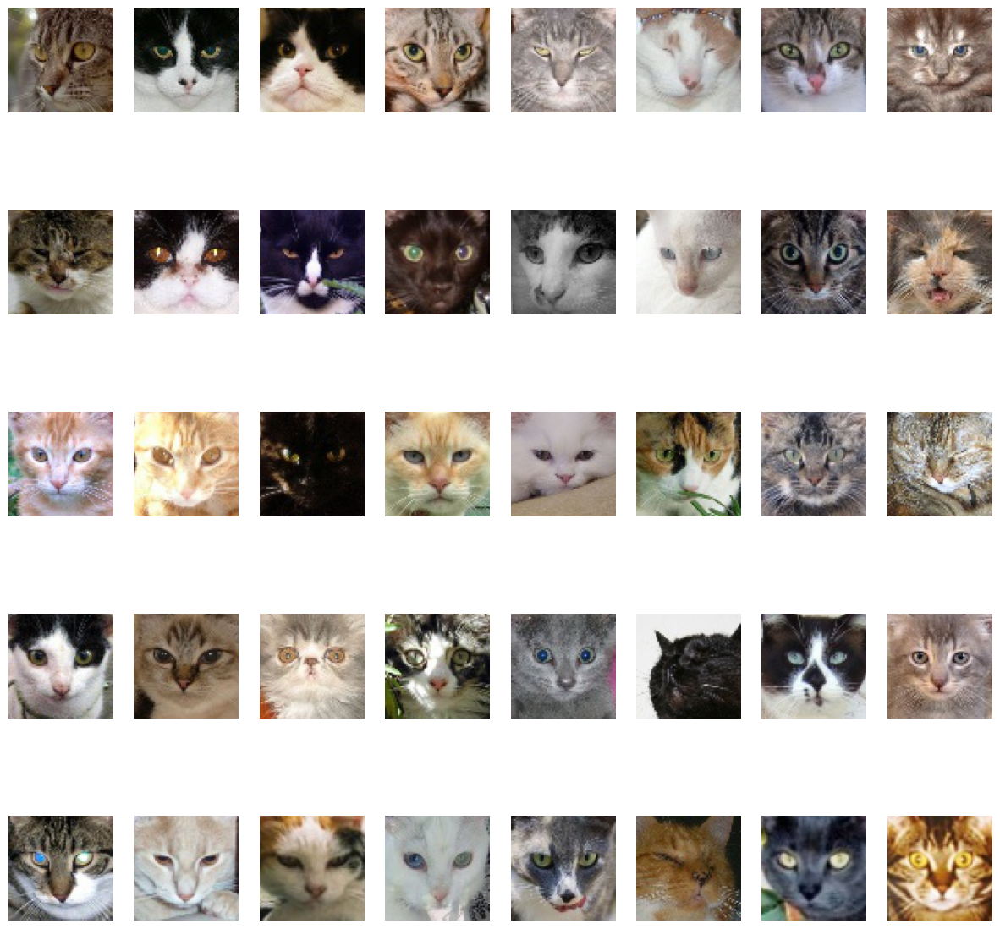

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Dataloader
train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

# Function to visualize a batch of images
def show_batch(dl, num_samples=40):
    images, _ = next(iter(dl))
    images = images[:num_samples]  # Select num_samples images from the batch
    images = denorm(images)

    nrows = 5
    ncols = num_samples // nrows

    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 15))
    axes = axes.flatten()
    for i, img in enumerate(images):
        ax = axes[i]
        img = img.permute(1, 2, 0)
        ax.imshow(img)
        ax.axis('off')
    plt.show()

# Display images
show_batch(train_dl, num_samples=40)

## Technique 2: Memory calculation of dataset

In [37]:
# Image dimensions and properties
image_width = 64
image_height = 64
num_channels = 3 
num_bytes_per_float = 4

# Size of each image tensor in bytes
image_tensor_size = image_width * image_height * num_channels * num_bytes_per_float

# Total number of images in the dataset
total_images = len(train_ds)

# Total memory usage of the dataset in bytes
total_memory_bytes = total_images * image_tensor_size

# Convervion to readable format
total_memory_mb = total_memory_bytes / (1024 * 1024)

print(f"Total memory usage of the cat images dataset: {total_memory_mb} MB")

Total memory usage of the cat images dataset: 738.140625 MB


## Technique 3: Finding image outliers in the dataset (images that are significantly different from others)

C:\Anaconda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\humza/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 36.0MB/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


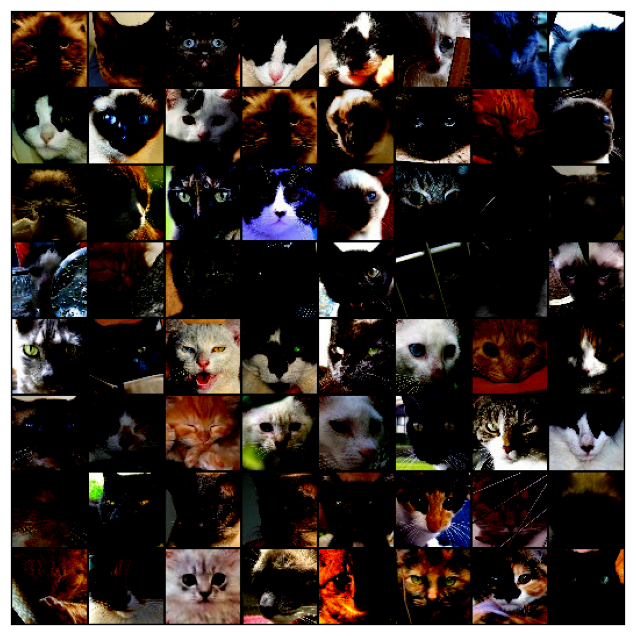

In [36]:
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Pretrained Model
model = models.resnet50(pretrained=True)
model.eval()  


# Dataloader
train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=False)

# Function to extract features
def extract_features(model, dataloader):
    features = []
    with torch.no_grad():
        for inputs, _ in dataloader:
            outputs = model(inputs)  # You may need to adapt this depending on your model
            features.extend(outputs.cpu().numpy())
    return np.array(features)

# Extraction of features
image_features = extract_features(model, train_dl)

from sklearn.ensemble import IsolationForest

# Isolation Forest for outlier detection
clf = IsolationForest(random_state=0).fit(image_features)
outlier_predictions = clf.predict(image_features)

# Outlier images
outlier_indices = np.where(outlier_predictions == -1)[0]
outlier_images = [train_ds[i][0] for i in outlier_indices]

# Function to show images
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images[:nmax]).permute(1, 2, 0))
    plt.show()

# Display outlier images
show_images(outlier_images)

## Technique 4: Number of Outliers

In [39]:
outlier_count = len(outlier_indices)  
print(outlier_count)

946


# Technique 5: Pixel Intensity Analysis

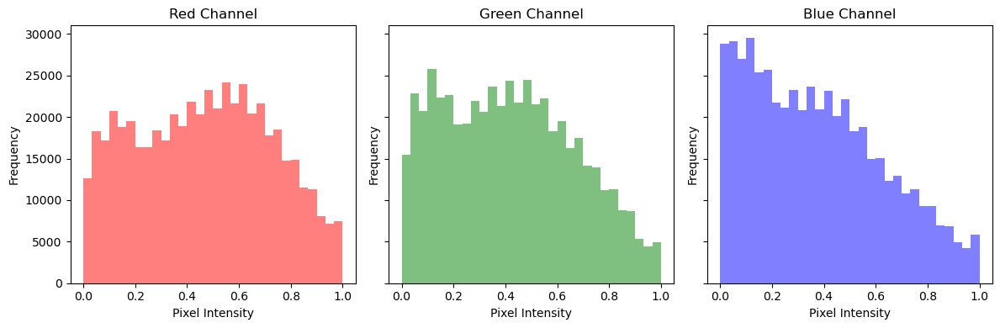

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Assuming 'data' is the path to your dataset
train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

# Function to plot pixel intensity histograms
def plot_pixel_intensity_histogram(images):
    # Denormalize images
    images = denorm(images)
    # Reshape to (num_images, channels, -1) to combine all pixels per channel
    pixels = images.view(images.size(0), 3, -1)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
    colors = ['red', 'green', 'blue']
    for i, color in enumerate(colors):
        axes[i].hist(pixels[:, i, :].numpy().flatten(), bins=30, color=color, alpha=0.5)
        axes[i].set_title(f'{color.capitalize()} Channel')
        axes[i].set_xlabel('Pixel Intensity')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Extract a batch of images
images, _ = next(iter(train_dl))

# Plot pixel intensity histograms for the batch
plot_pixel_intensity_histogram(images)

# Task 4: Preprocessing

In [27]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_ds = ImageFolder(data, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

# Machine Learning Models

# Generative Adversarial Network (50 epochs)

Epoch [1/50], d_loss: 1.2750, g_loss: 2.6785
Epoch [2/50], d_loss: 0.6947, g_loss: 12.4264
Epoch [3/50], d_loss: 0.2770, g_loss: 4.9733
Epoch [4/50], d_loss: 1.0875, g_loss: 9.9925
Epoch [5/50], d_loss: 1.1668, g_loss: 7.1586
Epoch [6/50], d_loss: 0.1603, g_loss: 5.0444
Epoch [7/50], d_loss: 2.5197, g_loss: 7.9114
Epoch [8/50], d_loss: 0.2237, g_loss: 6.8786
Epoch [9/50], d_loss: 0.8798, g_loss: 5.3333
Epoch [10/50], d_loss: 1.0042, g_loss: 4.2773
Epoch [11/50], d_loss: 0.9553, g_loss: 13.1051
Epoch [12/50], d_loss: 0.8413, g_loss: 3.5038
Epoch [13/50], d_loss: 0.1936, g_loss: 7.3027
Epoch [14/50], d_loss: 0.3050, g_loss: 3.9014
Epoch [15/50], d_loss: 0.1641, g_loss: 6.2887
Epoch [16/50], d_loss: 0.3993, g_loss: 10.5512
Epoch [17/50], d_loss: 0.6036, g_loss: 4.6616
Epoch [18/50], d_loss: 0.0393, g_loss: 5.3263
Epoch [19/50], d_loss: 1.8685, g_loss: 0.0080
Epoch [20/50], d_loss: 0.5768, g_loss: 3.9785
Epoch [21/50], d_loss: 0.1772, g_loss: 5.9811
Epoch [22/50], d_loss: 0.5243, g_loss: 2

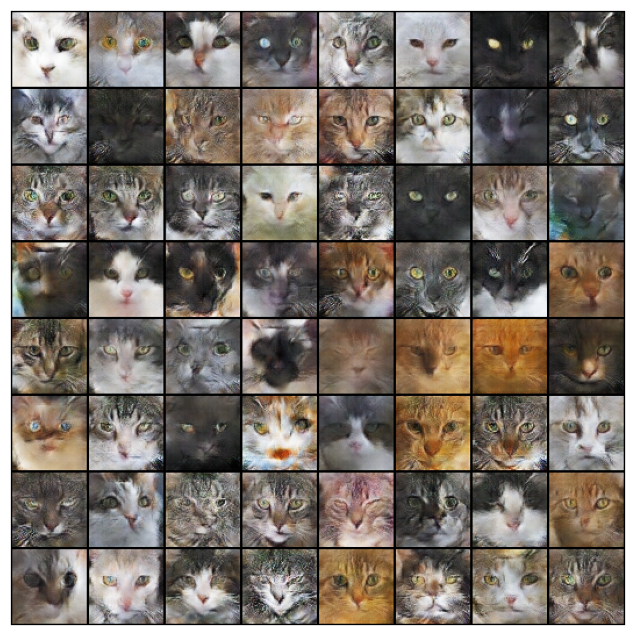

In [29]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 50  

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Display of some generated images
show_generated_images(generator)

# Boosting Techniques

# Removing Outliers (1 epoch)

Epoch [1/1], d_loss: 0.4200, g_loss: 3.6553


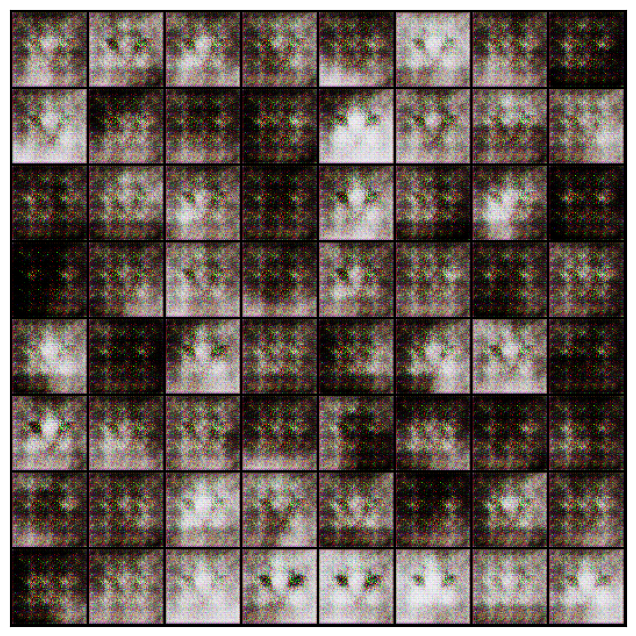

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 1

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Display of some generated images after training
show_generated_images(generator)

# Removing Outliers (18 epochs)

Epoch [1/18], d_loss: 2.0773, g_loss: 1.9525
Epoch [2/18], d_loss: 0.4587, g_loss: 4.5898
Epoch [3/18], d_loss: 0.1424, g_loss: 3.7456
Epoch [4/18], d_loss: 0.4449, g_loss: 7.1019
Epoch [5/18], d_loss: 0.1153, g_loss: 4.7526
Epoch [6/18], d_loss: 0.0059, g_loss: 7.0513
Epoch [7/18], d_loss: 0.0574, g_loss: 6.9749
Epoch [8/18], d_loss: 0.1234, g_loss: 6.0971
Epoch [9/18], d_loss: 0.3019, g_loss: 4.3333
Epoch [10/18], d_loss: 0.0275, g_loss: 4.2831
Epoch [11/18], d_loss: 1.0125, g_loss: 6.5040
Epoch [12/18], d_loss: 0.0601, g_loss: 6.1658
Epoch [13/18], d_loss: 0.0208, g_loss: 4.2252
Epoch [14/18], d_loss: 0.0255, g_loss: 5.0328
Epoch [15/18], d_loss: 0.0073, g_loss: 8.1371
Epoch [16/18], d_loss: 0.0088, g_loss: 7.1822
Epoch [17/18], d_loss: 0.0425, g_loss: 6.1479
Epoch [18/18], d_loss: 0.2697, g_loss: 7.1944


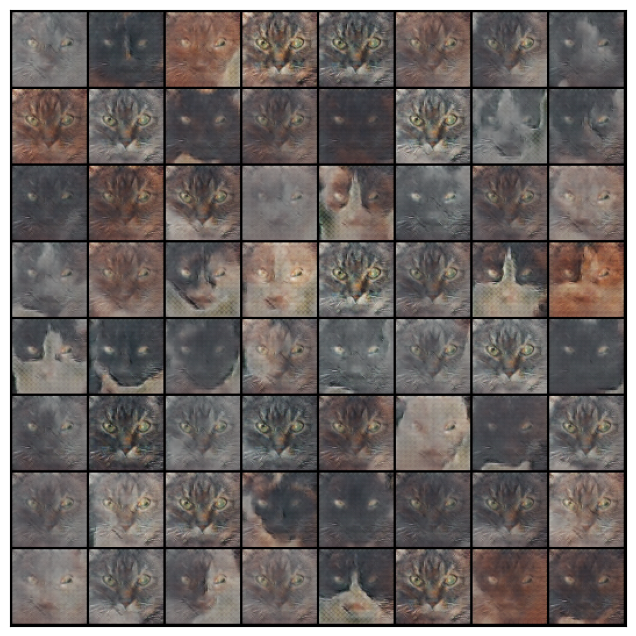

In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 18

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Display of some generated images after training
show_generated_images(generator)

# Removing Outliers (50 epochs)

Epoch [1/50], d_loss: 0.9857, g_loss: 6.7861
Epoch [2/50], d_loss: 0.7309, g_loss: 3.4902
Epoch [3/50], d_loss: 0.4230, g_loss: 3.2288
Epoch [4/50], d_loss: 1.1315, g_loss: 12.6671
Epoch [5/50], d_loss: 0.5762, g_loss: 1.6638
Epoch [6/50], d_loss: 0.9735, g_loss: 9.6649
Epoch [7/50], d_loss: 2.0026, g_loss: 0.4710
Epoch [8/50], d_loss: 0.9970, g_loss: 7.9384
Epoch [9/50], d_loss: 0.6697, g_loss: 10.2412
Epoch [10/50], d_loss: 2.1428, g_loss: 4.1515
Epoch [11/50], d_loss: 0.2039, g_loss: 4.8738
Epoch [12/50], d_loss: 0.7111, g_loss: 4.0111
Epoch [13/50], d_loss: 0.4291, g_loss: 7.0153
Epoch [14/50], d_loss: 1.1007, g_loss: 15.5229
Epoch [15/50], d_loss: 0.3302, g_loss: 5.1188
Epoch [16/50], d_loss: 1.1691, g_loss: 7.1529
Epoch [17/50], d_loss: 1.1644, g_loss: 0.1288
Epoch [18/50], d_loss: 2.2212, g_loss: 17.2037
Epoch [19/50], d_loss: 0.5998, g_loss: 3.5090
Epoch [20/50], d_loss: 1.4016, g_loss: 0.3215
Epoch [21/50], d_loss: 0.1325, g_loss: 3.6969
Epoch [22/50], d_loss: 0.3599, g_loss: 

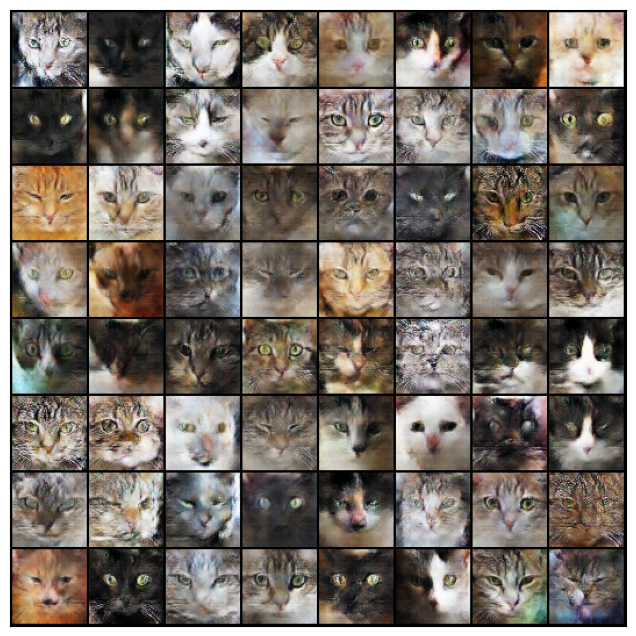

In [65]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 50

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()
    
# Display of some generated images after training
show_generated_images(generator)

# GAN (1 Epoch)

Epoch [1/1], d_loss: 0.8857, g_loss: 2.1183


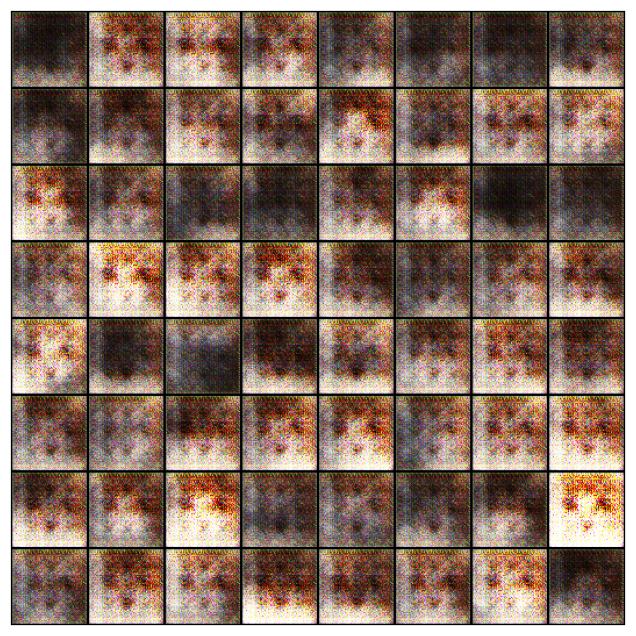

In [28]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()

# Training Loop
num_epochs = 1

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Display of some generated images
show_generated_images(generator)

## GAN (18 Epochs)

Epoch [1/18], d_loss: 0.5887, g_loss: 5.7505
Epoch [2/18], d_loss: 0.7988, g_loss: 11.1531
Epoch [3/18], d_loss: 1.6672, g_loss: 11.7337
Epoch [4/18], d_loss: 0.6017, g_loss: 2.6569
Epoch [5/18], d_loss: 0.9618, g_loss: 5.2487
Epoch [6/18], d_loss: 0.2652, g_loss: 10.0929
Epoch [7/18], d_loss: 0.6736, g_loss: 12.6810
Epoch [8/18], d_loss: 1.1844, g_loss: 2.6820
Epoch [9/18], d_loss: 0.5044, g_loss: 2.0980
Epoch [10/18], d_loss: 0.2601, g_loss: 7.1524
Epoch [11/18], d_loss: 0.0993, g_loss: 4.4398
Epoch [12/18], d_loss: 0.1663, g_loss: 6.7811
Epoch [13/18], d_loss: 0.4091, g_loss: 7.8856
Epoch [14/18], d_loss: 1.6321, g_loss: 4.7689
Epoch [15/18], d_loss: 0.2664, g_loss: 6.9938
Epoch [16/18], d_loss: 0.1226, g_loss: 6.2292
Epoch [17/18], d_loss: 0.2806, g_loss: 4.0996
Epoch [18/18], d_loss: 1.9673, g_loss: 0.1420


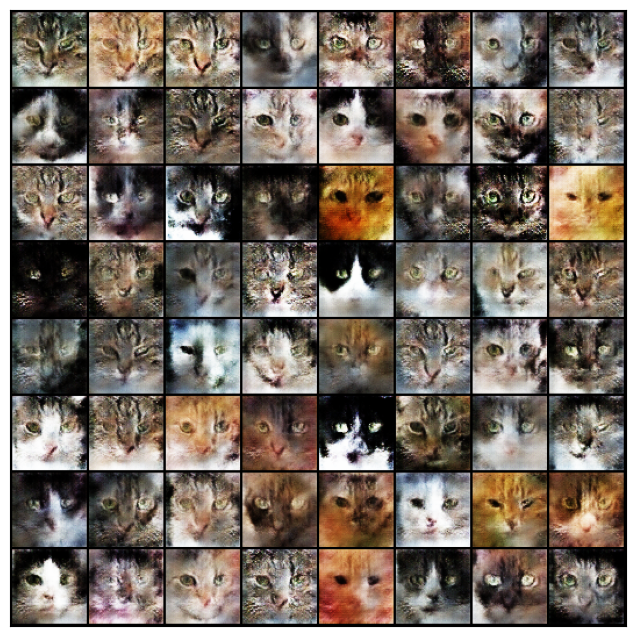

In [45]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Creation of GAN Components
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).view(-1, 1).squeeze(1)

# Hyperparameters for GAN
nz = 100 
ngf = 64 
ndf = 64  
nc = 3  

# Creation of the generator and discriminator
generator = Generator(nz, ngf, nc)
discriminator = Discriminator(ndf, nc)

# Definition of Optimizers for both Generator and Discriminator
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Definition of Loss Function
criterion = nn.BCELoss()
a
# Training Loop
num_epochs = 18

for epoch in range(num_epochs):
    for real_images, _ in train_dl:
        batch_size = real_images.size(0)

        # Training of Discriminator
        real_labels = torch.ones(batch_size)
        fake_labels = torch.zeros(batch_size)

        discriminator.zero_grad()

        # Real images
        outputs = discriminator(real_images)
        d_loss_real = criterion(outputs, real_labels)
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, nz, 1, 1)
        fake_images = generator(z)
        outputs = discriminator(fake_images.detach())
        d_loss_fake = criterion(outputs, fake_labels)
        d_loss_fake.backward()

        d_optimizer.step()

        # Training of Generator
        generator.zero_grad()
        outputs = discriminator(fake_images)
        g_loss = criterion(outputs, real_labels)
        g_loss.backward()
        g_optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {d_loss_real.item() + d_loss_fake.item():.4f}, g_loss: {g_loss.item():.4f}")

# Function to show generated images
def show_generated_images(generator, num_images=64):
    z = torch.randn(num_images, nz, 1, 1)
    fake_images = generator(z)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images), nrow=8).permute(1, 2, 0))
    plt.show()

# Display of some generated images
show_generated_images(generator)

# Auto-Regressive Model 

Epoch [1/5], Loss: 0.1808
Epoch [2/5], Loss: 0.3056
Epoch [3/5], Loss: 0.1712
Epoch [4/5], Loss: 0.1342


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/5], Loss: 0.0730


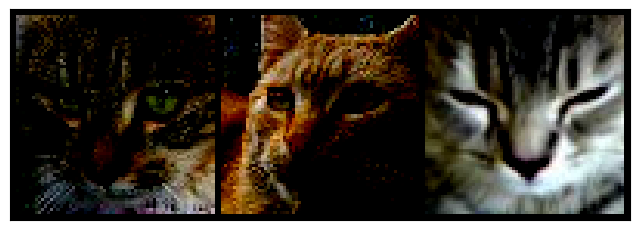

In [4]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 5 

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
show_images(images)

# Boosting Techniques

# Auto-Regressive Model (50 Epochs)

Epoch [1/50], Loss: 0.1537
Epoch [2/50], Loss: 0.1201
Epoch [3/50], Loss: 0.0789
Epoch [4/50], Loss: 0.1207
Epoch [5/50], Loss: 0.0672
Epoch [6/50], Loss: 0.0796
Epoch [7/50], Loss: 0.1438
Epoch [8/50], Loss: 0.1972
Epoch [9/50], Loss: 0.2300
Epoch [10/50], Loss: 0.3046
Epoch [11/50], Loss: 0.3507
Epoch [12/50], Loss: 0.2014
Epoch [13/50], Loss: 0.0876
Epoch [14/50], Loss: 0.2134
Epoch [15/50], Loss: 0.0679
Epoch [16/50], Loss: 0.0335
Epoch [17/50], Loss: 0.1979
Epoch [18/50], Loss: 0.0578
Epoch [19/50], Loss: 0.1717
Epoch [20/50], Loss: 0.2141
Epoch [21/50], Loss: 0.2512
Epoch [22/50], Loss: 0.1472
Epoch [23/50], Loss: 0.1512
Epoch [24/50], Loss: 0.1893
Epoch [25/50], Loss: 0.4071
Epoch [26/50], Loss: 0.2126
Epoch [27/50], Loss: 0.1181
Epoch [28/50], Loss: 0.2418
Epoch [29/50], Loss: 0.1033
Epoch [30/50], Loss: 0.0545
Epoch [31/50], Loss: 0.0855
Epoch [32/50], Loss: 0.1469
Epoch [33/50], Loss: 0.2450
Epoch [34/50], Loss: 0.1111
Epoch [35/50], Loss: 0.1387
Epoch [36/50], Loss: 0.2023
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [50/50], Loss: 0.3575


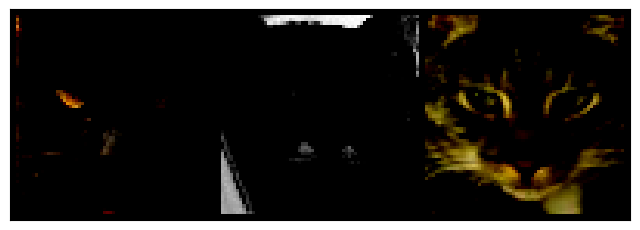

In [5]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 50

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
show_images(images)

## Removing Outliers (1 epoch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.1694


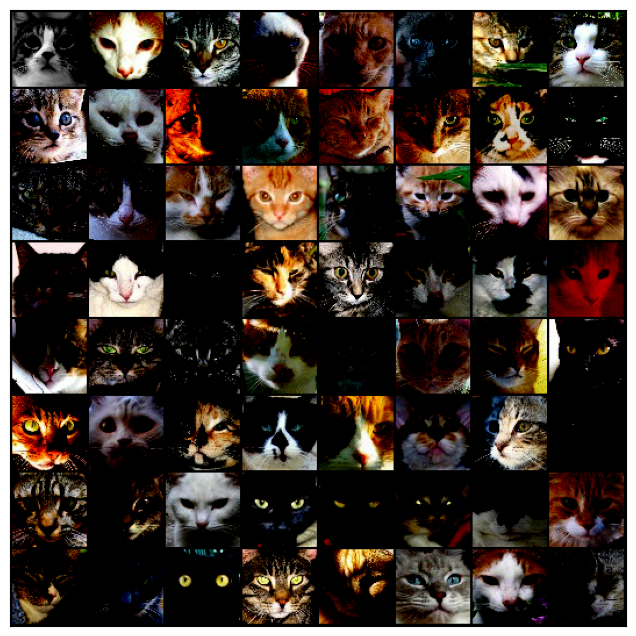

In [43]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )
        
    def forward(self, x):
        return self.net(x)
    

# Assuming 'data' is the path to your dataset
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Training loop
num_epochs = 1
for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Display function for images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
images, _ = next(iter(train_dl))
show_images(images)


## Removing Outliers (50 epochs)

Epoch [1/50], Loss: 0.1926
Epoch [2/50], Loss: 0.2886
Epoch [3/50], Loss: 0.2541
Epoch [4/50], Loss: 0.2104
Epoch [5/50], Loss: 0.1467
Epoch [6/50], Loss: 0.1780
Epoch [7/50], Loss: 0.1930
Epoch [8/50], Loss: 0.0911
Epoch [9/50], Loss: 0.0958
Epoch [10/50], Loss: 0.1366
Epoch [11/50], Loss: 0.2638
Epoch [12/50], Loss: 0.1724
Epoch [13/50], Loss: 0.1555
Epoch [14/50], Loss: 0.1619
Epoch [15/50], Loss: 0.0624
Epoch [16/50], Loss: 0.1357
Epoch [17/50], Loss: 0.1114
Epoch [18/50], Loss: 0.3426
Epoch [19/50], Loss: 0.1396
Epoch [20/50], Loss: 0.1618
Epoch [21/50], Loss: 0.0965
Epoch [22/50], Loss: 0.3323
Epoch [23/50], Loss: 0.4386
Epoch [24/50], Loss: 0.1645
Epoch [25/50], Loss: 0.1198
Epoch [26/50], Loss: 0.1707
Epoch [27/50], Loss: 0.1278
Epoch [28/50], Loss: 0.2105
Epoch [29/50], Loss: 0.1319
Epoch [30/50], Loss: 0.1149
Epoch [31/50], Loss: 0.2992
Epoch [32/50], Loss: 0.1819
Epoch [33/50], Loss: 0.2699
Epoch [34/50], Loss: 0.1566
Epoch [35/50], Loss: 0.1101
Epoch [36/50], Loss: 0.1793
E

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [50/50], Loss: 0.1166


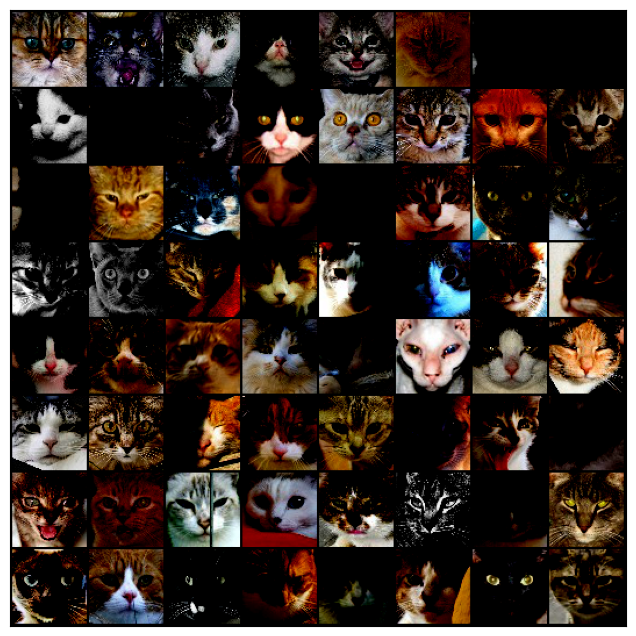

In [44]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )
        
    def forward(self, x):
        return self.net(x)
    

# Assuming 'data' is the path to your dataset
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Training loop
num_epochs = 50
for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Display function for images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
images, _ = next(iter(train_dl))
show_images(images)

## Auto-Regressive Model (1 epoch)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.0854


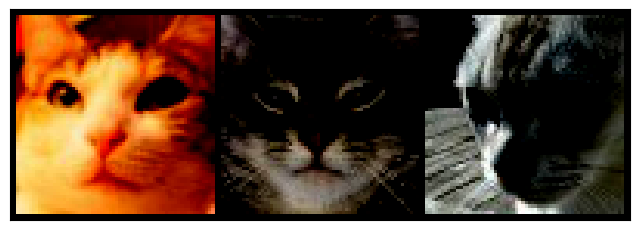

In [6]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 1

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
show_images(images)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.2062


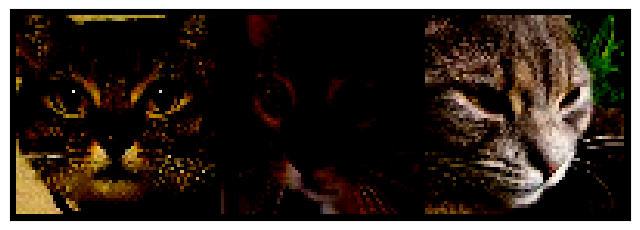

In [31]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Create the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 1

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
show_images(images)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/1], Loss: 0.2235


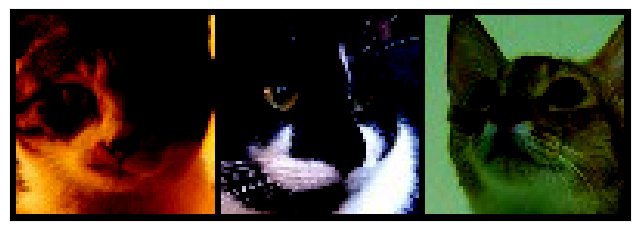

In [ ]:
class AutoRegressiveModel(nn.Module):
    def __init__(self, input_channels, output_channels):
        super(AutoRegressiveModel, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, output_channels, kernel_size=3, padding=1),
            nn.Sigmoid()  
        )

    def forward(self, x):
        return self.net(x)
    
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

train_ds = datasets.ImageFolder(data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*stats)
]))

train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)


# Creates the model
input_channels = 3  
output_channels = 3  
model = AutoRegressiveModel(input_channels, output_channels)

# Definition of the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Definition of the loss function
criterion = nn.MSELoss()

# Training loop
num_epochs = 1

for epoch in range(num_epochs):
    for images, _ in train_dl:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Function to show generated images
def show_images(batch, num_images=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(batch[:num_images], nrow=8).permute(1, 2, 0))
    plt.show()

# Display some images
show_images(images)

# Autoencoder

In [34]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder

# Definition of the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Creates an instance of the autoencoder
autoencoder = Autoencoder()

# Definition of loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    for data in train_dl:
        inputs, _ = data
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Saves the trained model if needed
torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')

Epoch [1/10], Loss: 0.0239
Epoch [2/10], Loss: 0.0216
Epoch [3/10], Loss: 0.0201
Epoch [4/10], Loss: 0.0097
Epoch [5/10], Loss: 0.0184
Epoch [6/10], Loss: 0.0066
Epoch [7/10], Loss: 0.0166
Epoch [8/10], Loss: 0.0097
Epoch [9/10], Loss: 0.0066
Epoch [10/10], Loss: 0.0043


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

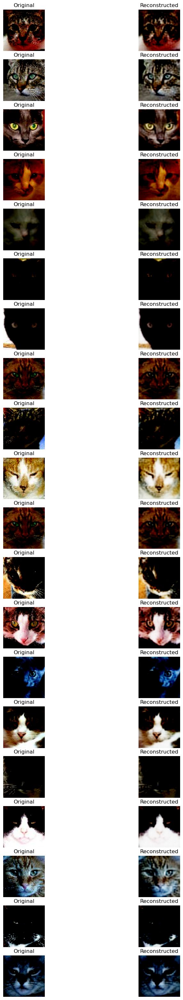

In [35]:
import matplotlib.pyplot as plt
import torch

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch 
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Converts tensors to numpy arrays for plotting
        selected_images_np = selected_images.permute(0, 2, 3, 1).cpu().numpy()
        decoded_images_np = decoded_images.permute(0, 2, 3, 1).cpu().detach().numpy()

        # Plots the original and reconstructed images
        fig, axes = plt.subplots(num_images, 2, figsize=(10, 2 * num_images))

        for i in range(num_images):
            axes[i, 0].imshow(selected_images_np[i])
            axes[i, 0].set_title('Original')
            axes[i, 0].axis('off')

            # Plots reconstructed images
            axes[i, 1].imshow(decoded_images_np[i])
            axes[i, 1].set_title('Reconstructed')
            axes[i, 1].axis('off')

        plt.show()

        break  

# Displays images
display_images(autoencoder, train_dl)

# Boosting Techniques

# Removing Outliers

In [49]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np

# Assuming 'data' is the path to your dataset
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Definition of the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Create an instance of the autoencoder and define loss and optimizer
autoencoder = Autoencoder()
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    for inputs, _ in train_dl:
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Save the trained model
torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')


Epoch [1/10], Loss: 0.0168
Epoch [2/10], Loss: 0.0158
Epoch [3/10], Loss: 0.0111
Epoch [4/10], Loss: 0.0199
Epoch [5/10], Loss: 0.0058
Epoch [6/10], Loss: 0.0068
Epoch [7/10], Loss: 0.0052
Epoch [8/10], Loss: 0.0087
Epoch [9/10], Loss: 0.0189
Epoch [10/10], Loss: 0.0064


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

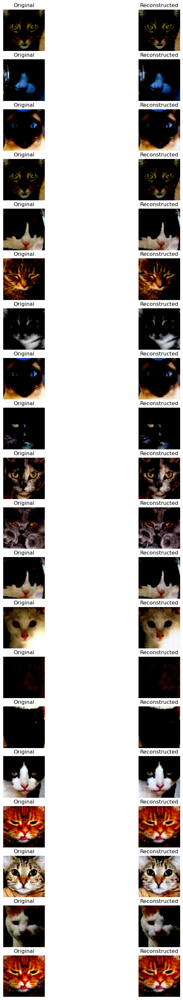

In [50]:
import matplotlib.pyplot as plt
import torch

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch 
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Converts tensors to numpy arrays for plotting
        selected_images_np = selected_images.permute(0, 2, 3, 1).cpu().numpy()
        decoded_images_np = decoded_images.permute(0, 2, 3, 1).cpu().detach().numpy()

        # Plots the original and reconstructed images
        fig, axes = plt.subplots(num_images, 2, figsize=(10, 2 * num_images))

        for i in range(num_images):
            axes[i, 0].imshow(selected_images_np[i])
            axes[i, 0].set_title('Original')
            axes[i, 0].axis('off')

            # Plots reconstructed images
            axes[i, 1].imshow(decoded_images_np[i])
            axes[i, 1].set_title('Reconstructed')
            axes[i, 1].axis('off')

        plt.show()

        break  

# Displays images
display_images(autoencoder, train_dl)

# Decreasing Epochs to 1

In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np

# Assuming 'data' is the path to your dataset
image_size = 64
batch_size = 128
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

# Load dataset without normalization for outlier detection
train_ds_raw = datasets.ImageFolder(root=data, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor()
]))

# Outlier detection function
def is_outlier(image, threshold=3):
    image_array = image.numpy()
    mean, std = np.mean(image_array), np.std(image_array)
    return mean > mean_global + threshold * std_global or mean < mean_global - threshold * std_global

# Compute global mean and std for the dataset
means, stds = [], []
for image, _ in train_ds_raw:
    image_array = image.numpy()
    means.append(np.mean(image_array))
    stds.append(np.std(image_array))
mean_global, std_global = np.mean(means), np.mean(stds)

# Filter out outliers
filtered_indices = [i for i, (img, _) in enumerate(train_ds_raw) if not is_outlier(img)]
filtered_ds = torch.utils.data.Subset(train_ds_raw, filtered_indices)

# Apply normalization to the filtered dataset
filtered_ds.dataset.transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(*stats)
])

# DataLoader for the filtered dataset
train_dl = DataLoader(filtered_ds, batch_size=batch_size, shuffle=True)

# Definition of the autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Create an instance of the autoencoder and define loss and optimizer
autoencoder = Autoencoder()
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

# Training loop
num_epochs = 1
for epoch in range(num_epochs):
    for inputs, _ in train_dl:
        optimizer.zero_grad()
        outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Save the trained model
torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')


Epoch [1/1], Loss: 0.0357


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

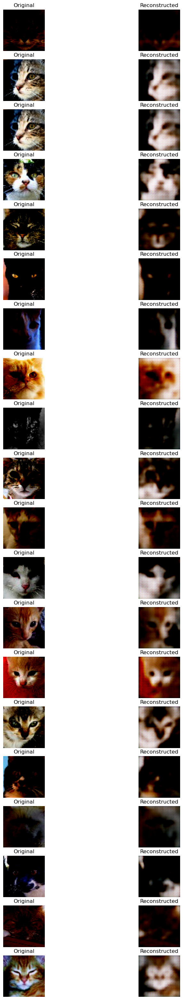

In [52]:
import matplotlib.pyplot as plt
import torch

def display_images(autoencoder, dataloader, num_images=20):
    autoencoder.eval()

    # Gets a batch of data from the DataLoader
    for batch in dataloader:
        images, _ = batch 
        indices = torch.randint(0, len(images), (num_images,))
        selected_images = images[indices]

        # Encodes the selected images
        encoded_images = autoencoder.encoder(selected_images)

        # Decodes the encoded images
        decoded_images = autoencoder.decoder(encoded_images)

        # Converts tensors to numpy arrays for plotting
        selected_images_np = selected_images.permute(0, 2, 3, 1).cpu().numpy()
        decoded_images_np = decoded_images.permute(0, 2, 3, 1).cpu().detach().numpy()

        # Plots the original and reconstructed images
        fig, axes = plt.subplots(num_images, 2, figsize=(10, 2 * num_images))

        for i in range(num_images):
            axes[i, 0].imshow(selected_images_np[i])
            axes[i, 0].set_title('Original')
            axes[i, 0].axis('off')

            # Plots reconstructed images
            axes[i, 1].imshow(decoded_images_np[i])
            axes[i, 1].set_title('Reconstructed')
            axes[i, 1].axis('off')

        plt.show()

        break  

# Displays images
display_images(autoencoder, train_dl)